# Analysis of scRNA-seq data from activated PBMCs in TWINS only

In CVID and healthy control, 10X platform

# B cell populations only (as annotated in M4 notebook & cleaned up in M5)

16.02.2021: reanalysis, correcting the bug in bertie function

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.7.3
airr==1.3.1
alabaster==0.7.12
alembic @ file:///home/conda/feedstock_root/build_artifacts/alembic_1611176215154/work
anndata @ file:///home/conda/feedstock_root/build_artifacts/anndata_1605539061264/work
annoy @ file:///home/conda/feedstock_root/build_artifacts/python-annoy_1610271511811/work
anyio @ file:///home/conda/feedstock_root/build_artifacts/anyio_1610315727443/work/dist
arboreto==0.1.6
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1610522574055/work
async-generator==1.10
async-timeout==3.0.1
attrs @ file:///home/conda/feedstock_root/build_artifacts/attrs_1605083924122/work
Babel @ file:///home/conda/feedstock_root/build_artifacts/babel_1605182336601/work
backcall @ file:///home/conda/feedstock_root/build_artifacts/backcall_1592338393461/work
backports.functools-lru-cache==1.6.1
bbknn @ file:///opt/conda/conda-bld/bbknn_1610991770283/work
bleach @ file:///home/conda/feedstock_root/build_artifacts/bleach_1611678357911/work
blinker==1.

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.4
chardet             3.0.4
cloudpickle         1.6.0
colorama            0.4.4
constants           NA
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.02.0
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
h5py                3.1.0
highs_wrapper       NA
idna                2.10
igraph              0.8.3
ipykernel           5.4.2
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.17.2
jinja2              2.11.2
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.2.2
jupyterla

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

## Reding the preprocessed object

Preprocessing happened in M1 notebook

In [6]:
# reading
adata = sc.read(save_path+'adata_raw_filtered.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 17662 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

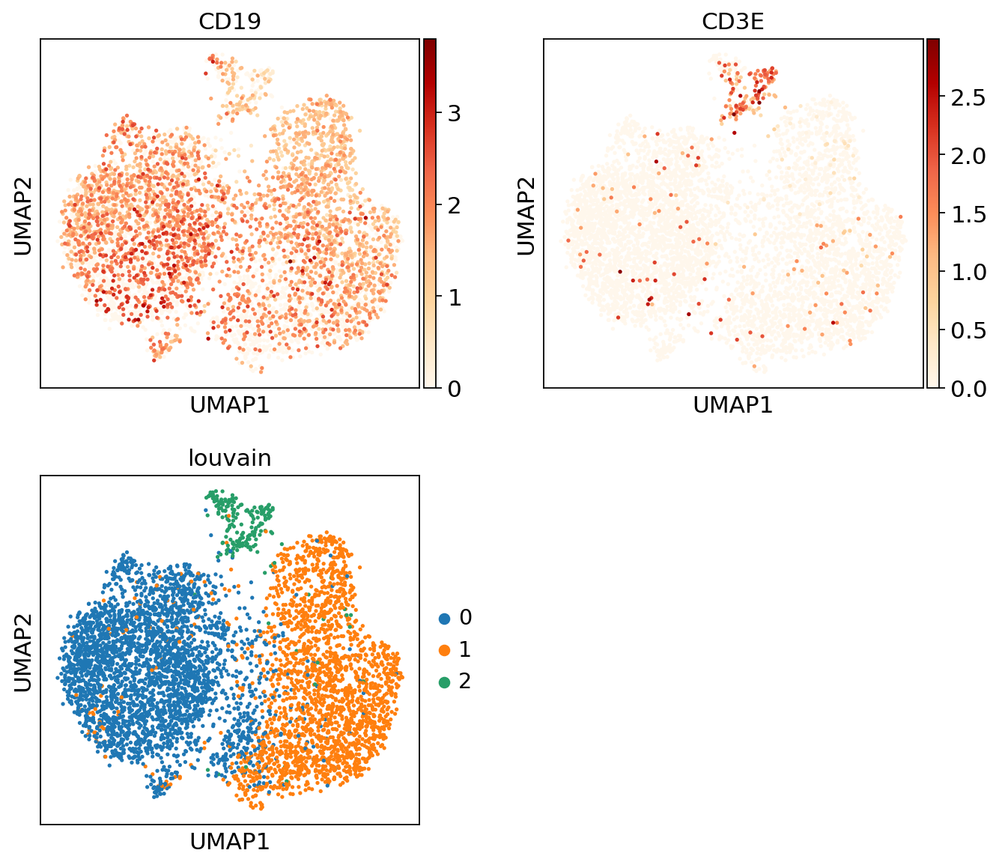

In [9]:
# reading object analysed in S0 notebook with louvain cluster labels - I need to get rid of cluster 2 - it's T:B contaminants (CD3+CD19+)
adata_with_louvain = sc.read(save_path + 'adata_hvg_BBKNN_by_sample_nodoublets_B_cells.h5ad')
sc.pl.umap(adata_with_louvain, color=['CD19','CD3E',
                                     'louvain'], 
           cmap='OrRd', use_raw=True, ncols=2)

In [12]:
np.unique(adata_with_louvain.obs['louvain'], return_counts=True)

(array(['0', '1', '2'], dtype=object), array([3027, 2092,  204]))

In [13]:
adata_with_louvain

AnnData object with n_obs × n_vars = 5323 × 2804
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [14]:
# discarding cluster 2
B_cell_indices = list(adata_with_louvain[-adata_with_louvain.obs['louvain'].isin(['2'])].obs_names)
len(B_cell_indices)

5119

In [15]:
# subsetting the adata to only B cells
adata = adata[B_cell_indices,:].copy()

In [16]:
adata

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

In [17]:
np.unique(adata.obs['sample'])

array(['Immunodeficiency8103070', 'Immunodeficiency8103072',
       'Immunodeficiency8103073', 'Immunodeficiency8103074',
       'Immunodeficiency8103076', 'Immunodeficiency8103077'], dtype=object)

In [18]:
# quick check to see if the values are integer
expr_mtx_protein = adata[adata.obs['sample'] == 'Immunodeficiency8103070'].X.todense()
np.unique(expr_mtx_protein)

matrix([[  0.,   0.,   0., ..., 437., 490., 536.]], dtype=float32)

In [19]:
adata

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

_____________________________________________________________________________________________________________________________________________________________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [20]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


___________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes


extracting highly variable genes
    finished (0:00:01)


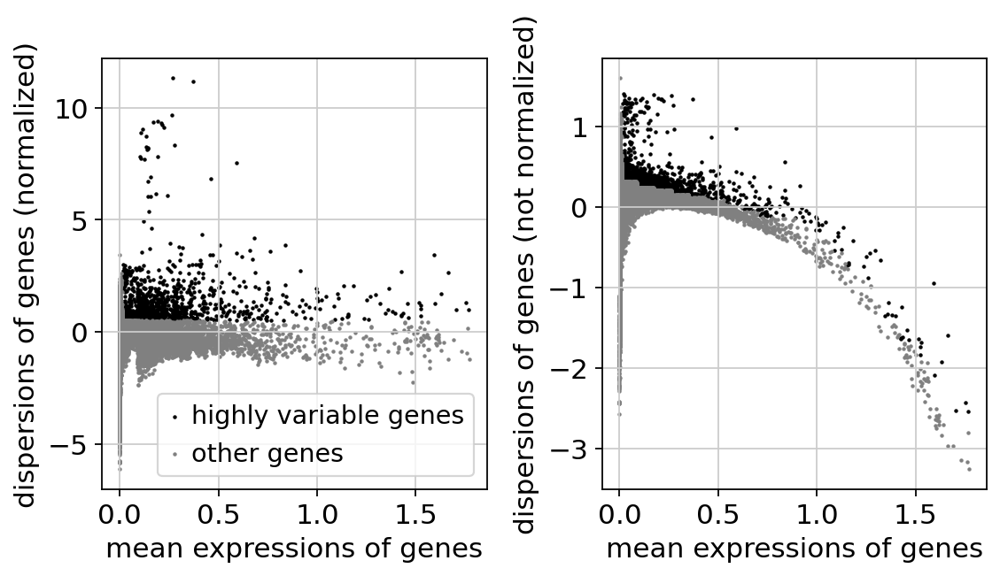

In [21]:
# getting only GEX data
cellcycle_adata = adata[:,adata.var['feature_types-0'] != 'Antibody Capture'].copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [22]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [23]:
%%time
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata, n_comps=30)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=30
    finished (0:00:00)
CPU times: user 3.06 s, sys: 4.52 s, total: 7.58 s
Wall time: 783 ms


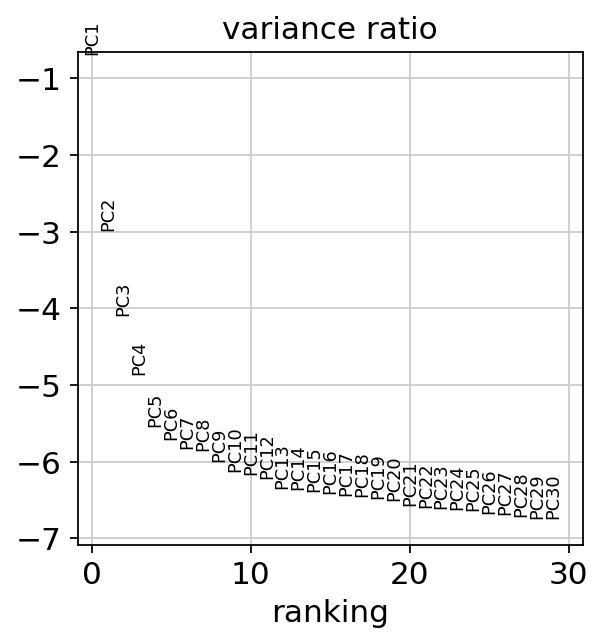

In [24]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 5
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


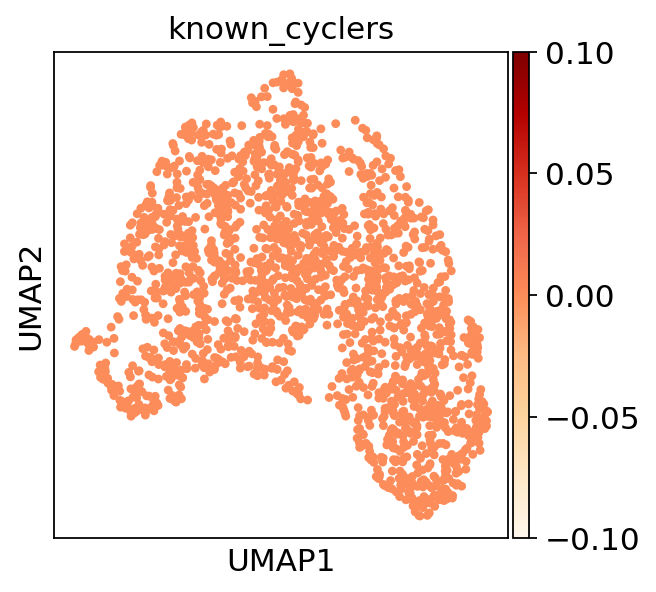

In [25]:
# Identify genes behaving like cc genes
num_pcs = 5
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


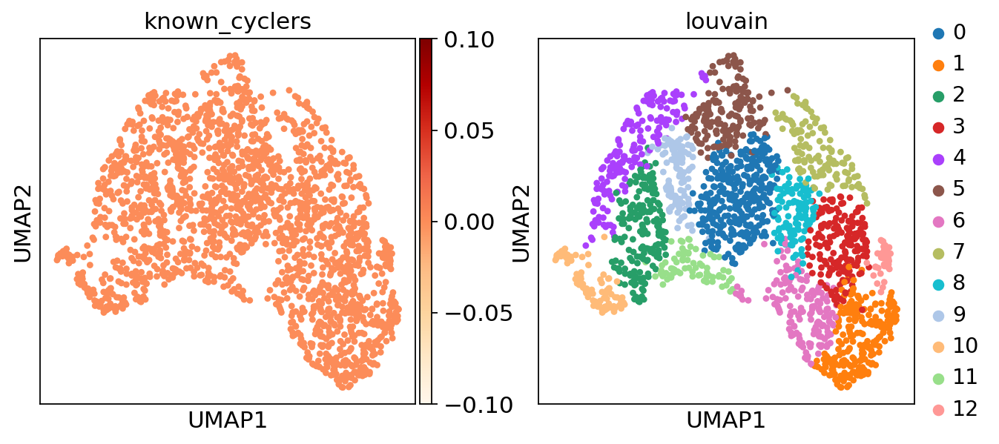

In [26]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [28]:
# Locate genes of interests' cluster
#print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


In [29]:
adata

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p'

Not removing any genes here

In [30]:
adata

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p'

In [31]:
%%time
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# takes a few minutes

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    626 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    750 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
CPU times: user 268 ms, sys: 40 ms, total: 308 ms
Wall time: 307 ms


In [32]:
adata

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    uns: 'log1p'

_______________________________________________________________________________________________________

# Subsetting to HVGs and scaling

In [33]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 940 ms, sys: 8 ms, total: 948 ms
Wall time: 949 ms


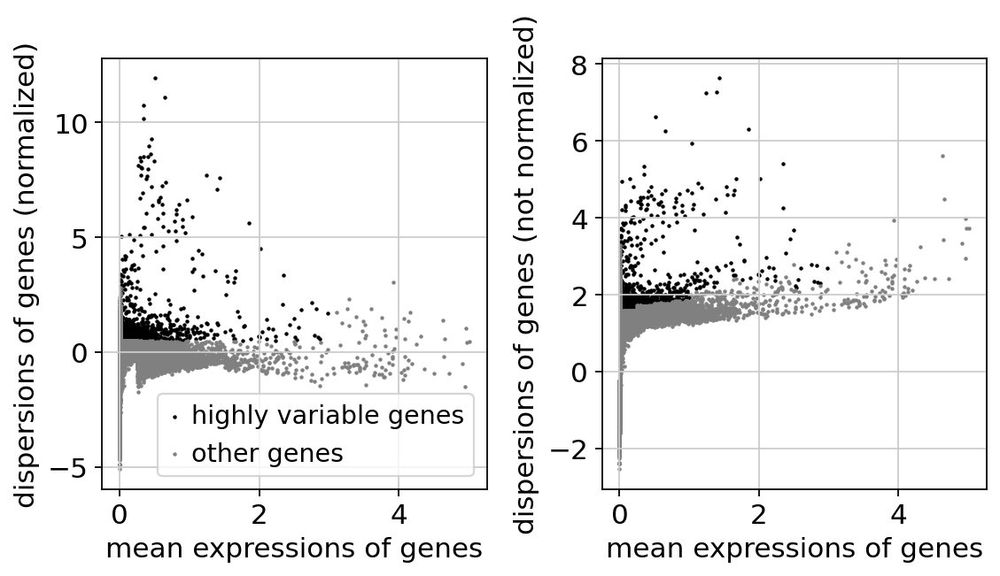

CPU times: user 452 ms, sys: 4 ms, total: 456 ms
Wall time: 454 ms


In [34]:
%%time
sc.pl.highly_variable_genes(adata)

In [35]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [36]:
adata_hvg

View of AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [37]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


CPU times: user 192 ms, sys: 92 ms, total: 284 ms
Wall time: 284 ms


________

## PCA

In [38]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
CPU times: user 12.2 s, sys: 18 s, total: 30.2 s
Wall time: 2.17 s


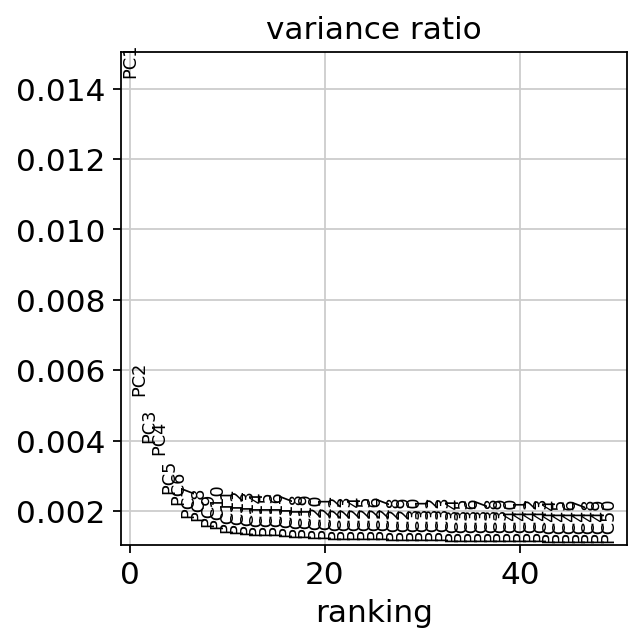

In [39]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [38]:
%%time
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=13)

computing neighbors
    using 'X_pca' with n_pcs = 13
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
CPU times: user 1.8 s, sys: 4.47 s, total: 6.26 s
Wall time: 825 ms


### OR

BBKNN by `sample`


In [40]:
%%time
bbknn.bbknn(adata_hvg, batch_key='sample')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:02)
CPU times: user 2.13 s, sys: 0 ns, total: 2.13 s
Wall time: 2.13 s


/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:289: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:290: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


__________________________________________________________________________________________________________________________________________________________________

In [41]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
CPU times: user 13.8 s, sys: 1.98 s, total: 15.8 s
Wall time: 13.2 s


# Plotting

In [42]:
adata_hvg

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [43]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

### BBKNN by `sample`

... storing 'phase' as categorical


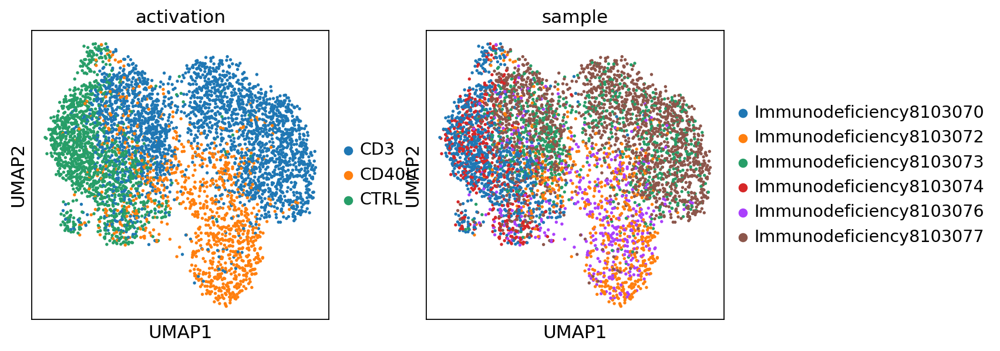

In [44]:
sc.pl.umap(adata_hvg, color=['activation','sample'])

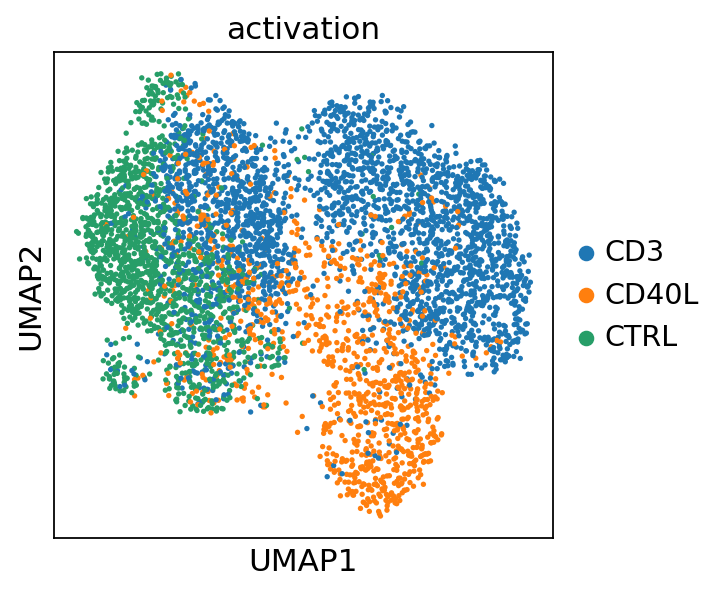

In [45]:
sc.pl.umap(adata_hvg, color=['activation'])

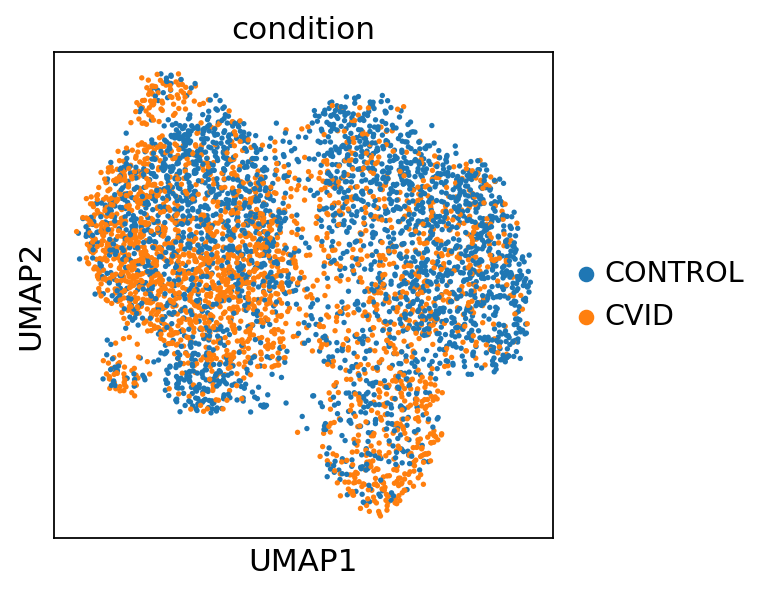

In [46]:
sc.pl.umap(adata_hvg, color=['condition'])

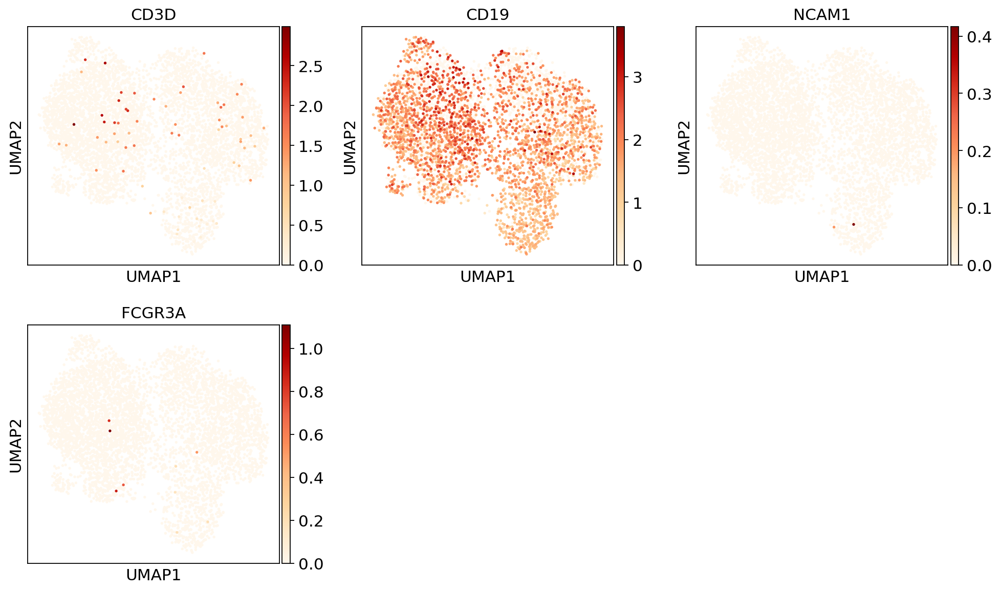

In [47]:
sc.pl.umap(adata_hvg, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

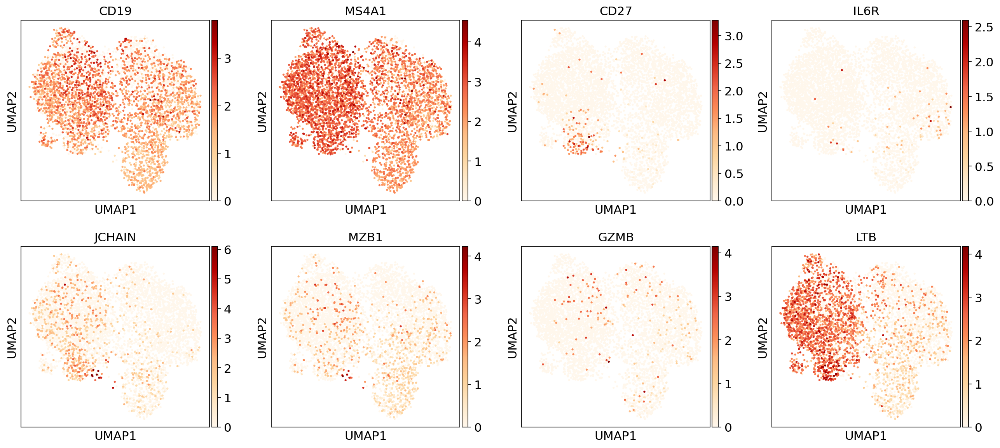

In [48]:
sc.pl.umap(adata_hvg, color=['CD19', # B cells
                                     'MS4A1', # CD20, B cells
                                     #'SDC1', # CD138, Plasma cells
                                     #'CDW78', # CD78
                                     'CD27', 'IL6R', # Plasma cells
                             'JCHAIN', 'MZB1', # Plasma cells
                             'GZMB', 'LTB', # expr in pDC but not Plasma cells
                            #'celltype_predictions',
                            ], 
           cmap='OrRd', use_raw=True,
          )

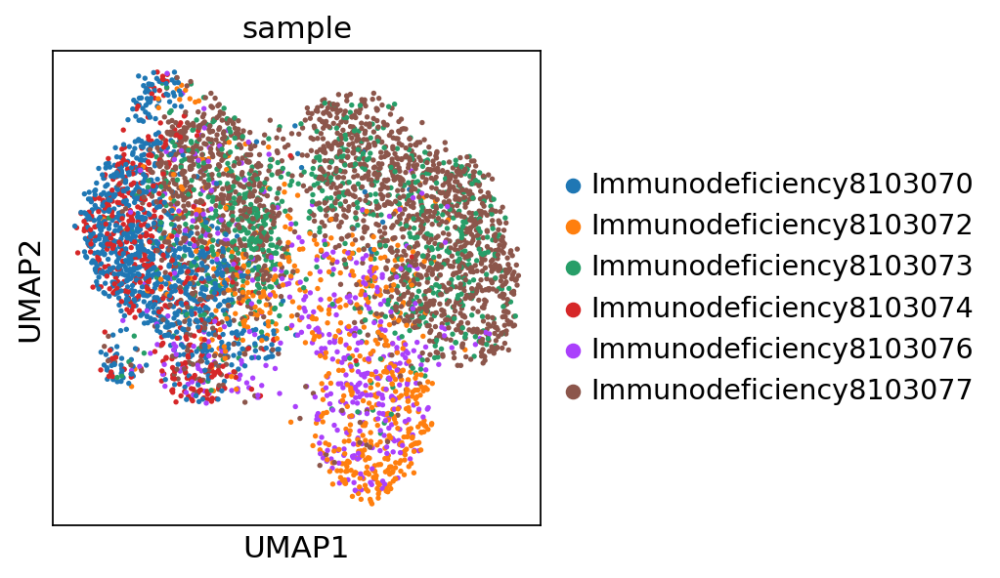

In [49]:
sc.pl.umap(adata_hvg, color=['sample'])

In [50]:
adata_hvg.obs['cell_type'] = adata_with_louvain.obs.loc[adata_hvg.obs_names, 'cell_type']

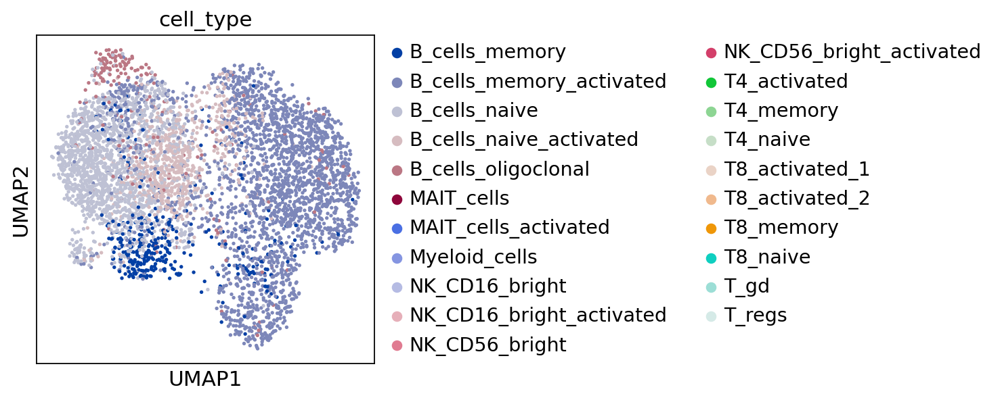

In [51]:
sc.pl.umap(adata_hvg, color=['cell_type'])

In [58]:
np.unique(adata_hvg.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

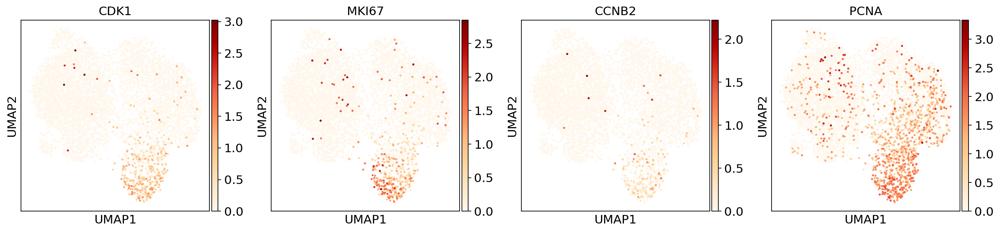

In [59]:
sc.pl.umap(adata_hvg, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [60]:
adata_hvg

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'activation_colors', 'sample_colors', 'condition_colors', 'cell_type_colors', 'phase_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

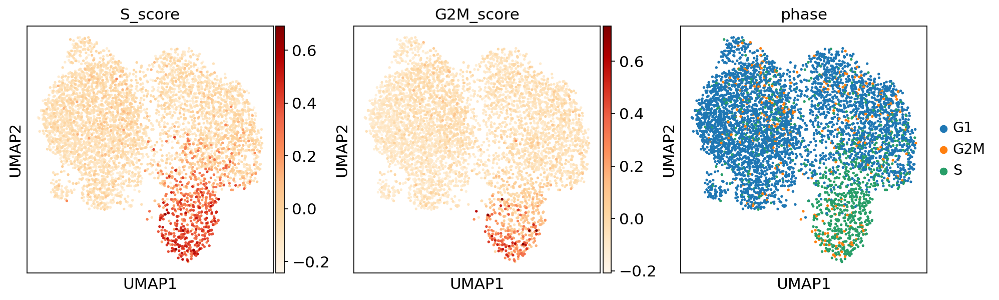

In [61]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

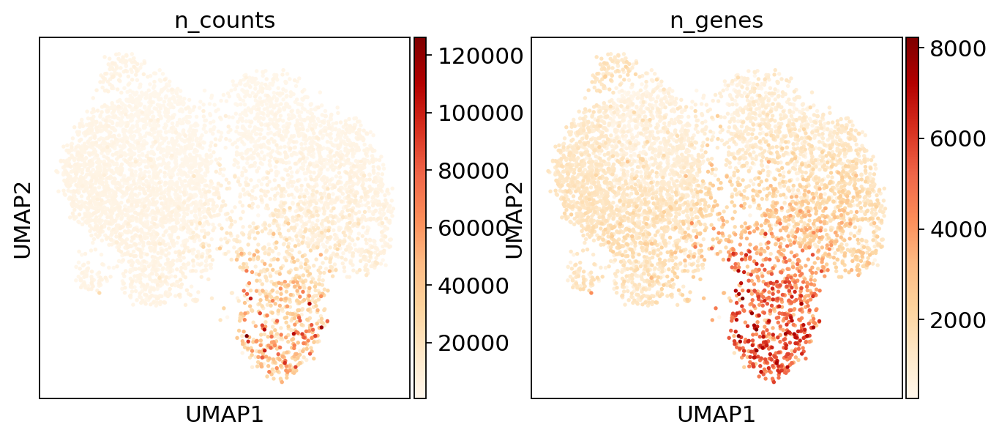

In [62]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

In [63]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [64]:
adata_hvg.write(save_path+'adata_hvg_BBKNN_by_sample_nodoublets_B_cells_cleanup_final_manifold.h5ad')

In [6]:
adata_hvg = sc.read(save_path+'adata_hvg_BBKNN_by_sample_nodoublets_B_cells_cleanup_final_manifold.h5ad')

In [7]:
adata_hvg

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

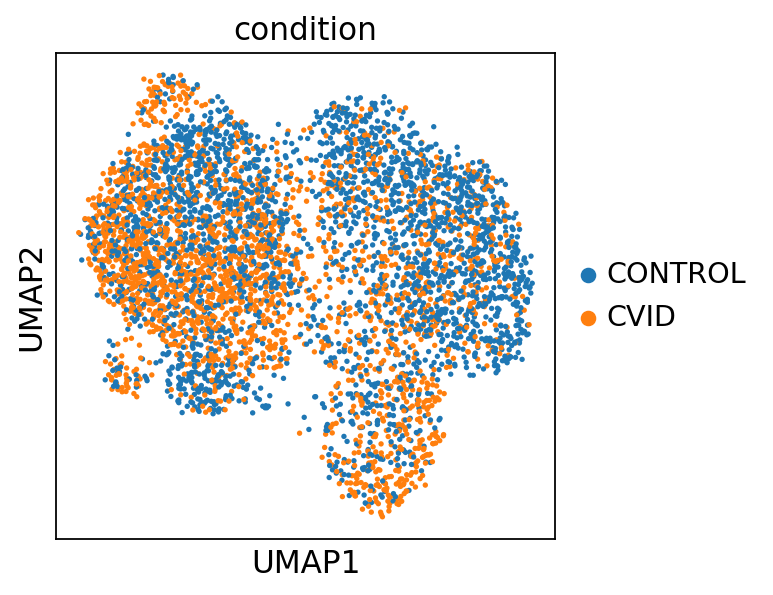

In [8]:
sc.pl.umap(adata_hvg, color=['condition'], 
          save='_20210224_B_cell_manifold_twins_condition.pdf')

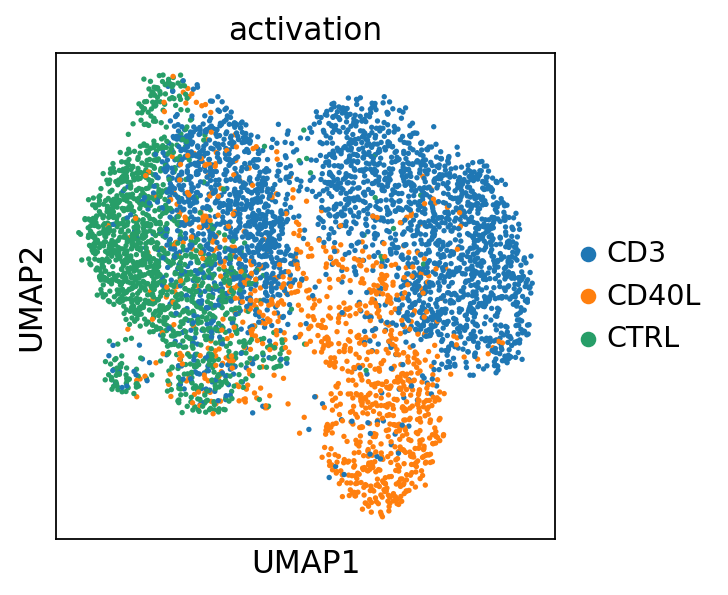

In [9]:
sc.pl.umap(adata_hvg, color=['activation'],
          save='_20210224_B_cell_manifold_twins_activation.pdf')

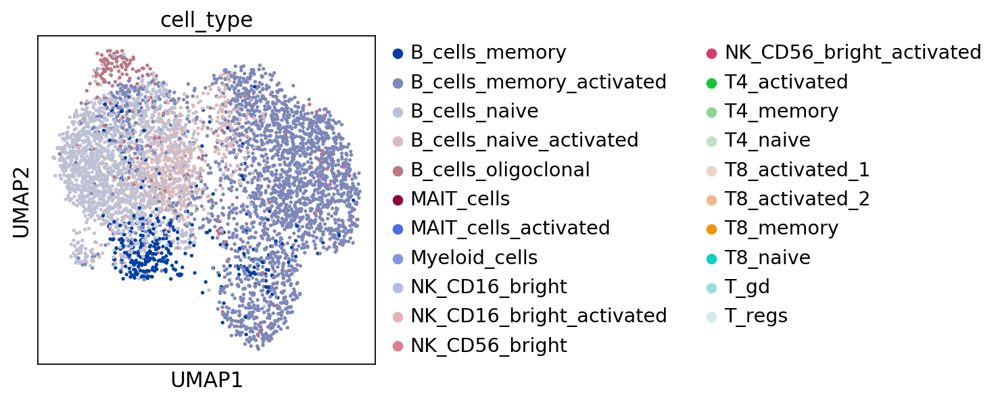

In [10]:
sc.pl.umap(adata_hvg, color=['cell_type'])

In [11]:
default_colors = adata_hvg.uns['cell_type_colors']
default_colors

array(['#023fa5', '#7d87b9', '#bec1d4', '#d6bcc0', '#bb7784', '#8e063b',
       '#4a6fe3', '#8595e1', '#b5bbe3', '#e6afb9', '#e07b91', '#d33f6a',
       '#11c638', '#8dd593', '#c6dec7', '#ead3c6', '#f0b98d', '#ef9708',
       '#0fcfc0', '#9cded6', '#d5eae7'], dtype=object)

In [12]:
new_colors = ['#023fa5', 'lightskyblue', '#bec1d4', 'lightcoral', '#bb7784', # B cell cluster colors
              
              '#8e063b',
       '#4a6fe3', '#8595e1', '#b5bbe3', '#e6afb9', '#e07b91', '#d33f6a',
       '#11c638', '#8dd593', '#c6dec7', '#ead3c6', '#f0b98d', '#ef9708',
       '#0fcfc0', '#9cded6', '#d5eae7']

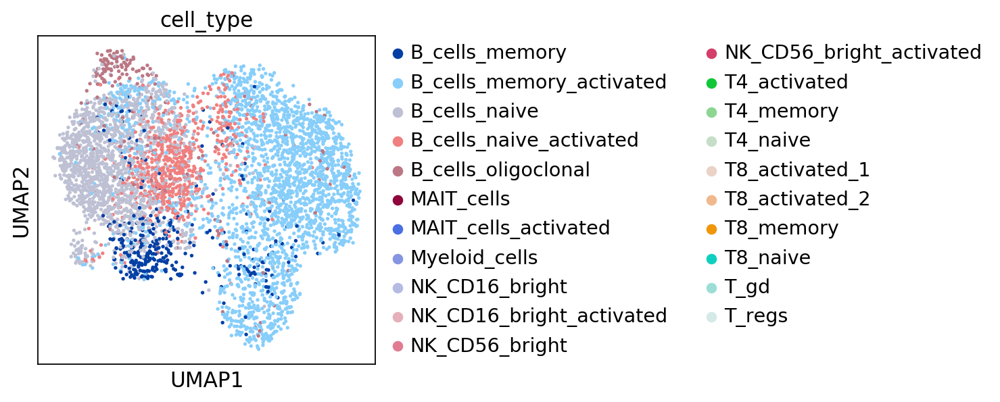

In [13]:
sc.pl.umap(adata_hvg, color=['cell_type'],
           palette=new_colors,
          save='_20210224_B_cell_manifold_twins_cell_type.pdf')

In [14]:
# adding predictions of Hamish's naive / memory B cells
Hamish_predictions = pd.read_csv(save_path + 'table_predictions_naive_memory_B_cells_from_Hamish_B_cells_20210216.csv',
                                index_col=0)
Hamish_predictions

,naive_memory_predictions_Hamish_all_genes,probabilities_naive_memory_predictions_Hamish_all_genes
index,,
TCAGGATCAGTTTACG-1,MBC,0.996569
GATCGCGTCCTACAGA-1,MBC,0.557541
CGATCGGCACGGCCAT-1,MBC,0.962025
CATGACACAACCGCCA-1,MBC,0.993500
GACAGAGAGTGTTTGC-1,MBC,0.892330
...,...,...
CGGCTAGAGGACTGGT-1,Naive,0.591125
CGACCTTAGTCAAGCG-1,MBC,0.607315
TTAGGACGTTCGTCTC-1,MBC,0.998612


In [15]:
adata_hvg.obs['Hamish_predictions'] = Hamish_predictions.loc[adata_hvg.obs_names, 'naive_memory_predictions_Hamish_all_genes']
adata_hvg.obs['Hamish_predicion_probabilities'] = Hamish_predictions.loc[adata_hvg.obs_names, 'probabilities_naive_memory_predictions_Hamish_all_genes']

In [22]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [23]:
# adding predictions of GC-like B cells, done in notebook S2
GC_predictions = pd.read_csv(save_path + 'table_predictions_GC_B_cells_20210216.csv',
                                index_col=0)
GC_predictions

,GC_celltype_predictions_all_genes,probabilities_GC_all_genes
index,,
TCAGGATCAGTTTACG-1,GC_B_cells,0.924863
GATCGCGTCCTACAGA-1,Other_B_cells,0.891639
CGATCGGCACGGCCAT-1,Other_B_cells,0.865484
CATGACACAACCGCCA-1,Other_B_cells,0.860315
GACAGAGAGTGTTTGC-1,Other_B_cells,0.600734
...,...,...
CGGCTAGAGGACTGGT-1,GC_B_cells,0.605533
CGACCTTAGTCAAGCG-1,Other_B_cells,0.772888
TTAGGACGTTCGTCTC-1,Other_B_cells,0.591494


In [25]:
adata_hvg.obs['GC_predictions'] = GC_predictions.loc[adata_hvg.obs_names, 'GC_celltype_predictions_all_genes']
adata_hvg.obs['GC_prediction_probabilities'] = GC_predictions.loc[adata_hvg.obs_names, 'probabilities_GC_all_genes']

In [27]:
# adding predictions of N/USM/SM B cells from our own SS2 data, done in notebook S2
N_USM_SM_predictions = pd.read_csv(save_path + 'table_predictions_N_USM_SM_B_cells_from_SS2_202102016.csv',
                                index_col=0)
N_USM_SM_predictions

,celltype_predictions_all_genes_from_SS2,probabilities_from_SS2_all_genes
index,,
TCAGGATCAGTTTACG-1,SM,0.513712
GATCGCGTCCTACAGA-1,USM,0.501827
CGATCGGCACGGCCAT-1,N,0.904602
CATGACACAACCGCCA-1,N,0.643940
GACAGAGAGTGTTTGC-1,N,0.783648
...,...,...
CGGCTAGAGGACTGGT-1,SM,0.687223
CGACCTTAGTCAAGCG-1,USM,0.796518
TTAGGACGTTCGTCTC-1,N,0.908238


In [29]:
adata_hvg.obs['N_USM_SM_predictions_from_SS2'] = N_USM_SM_predictions.loc[adata_hvg.obs_names, 'celltype_predictions_all_genes_from_SS2']
adata_hvg.obs['N_USM_SM_predictions_from_SS2_probabilities'] = N_USM_SM_predictions.loc[adata_hvg.obs_names, 'probabilities_from_SS2_all_genes']

... storing 'Hamish_predictions' as categorical


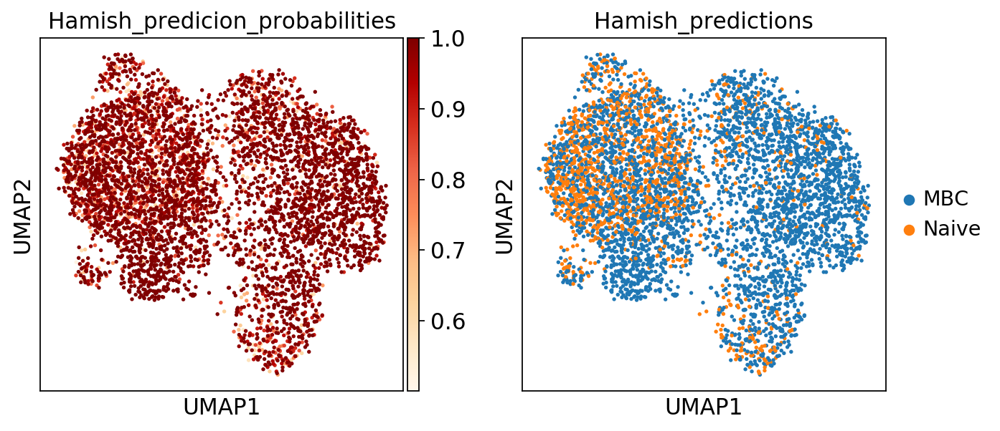

In [16]:
sc.pl.umap(adata_hvg, color=['Hamish_predicion_probabilities',
                             'Hamish_predictions'],
           cmap='OrRd',
           #palette=new_colors,
          save='_20210224_B_cell_manifold_twins_Hamish_predictions.pdf')

# Preparing the object for cellxgene

In [30]:
adata_hvg

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'Hamish_predictions', 'Hamish_predicion_probabilities', 'GC_predictions', 'GC_prediction_probabilities', 'N_USM_SM_predictions_from_SS2', 'N_USM_SM_predictions_from_SS2_probabilities'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'neighbors', 'pc

In [31]:
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [32]:
adata_full

AnnData object with n_obs × n_vars = 5119 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'Hamish_predictions', 'Hamish_predicion_probabilities', 'GC_predictions', 'GC_prediction_probabilities', 'N_USM_SM_predictions_from_SS2', 'N_USM_SM_predictions_from_SS2_probabilities'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'
    obsm: 'X_pca', 'X_umap'

In [33]:
import scipy
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [34]:
adata_full.obs.columns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'S_score', 'G2M_score', 'phase', 'cell_type', 'Hamish_predictions',
       'Hamish_predicion_probabilities', 'GC_predictions',
       'GC_prediction_probabilities', 'N_USM_SM_predictions_from_SS2',
       'N_USM_SM_predictions_from_SS2_probabilities'],
      dtype='object')

In [35]:
categ_columns = ['activation', 'batch', 'condition','sample',
                 'phase', 'cell_type', 'Hamish_predictions',
                 'GC_predictions', 'N_USM_SM_predictions_from_SS2']

cont_columns = ['n_counts', 'n_genes', 'percent_mito', 
                'S_score', 'G2M_score', 
                'Hamish_predicion_probabilities', 'GC_prediction_probabilities', 
                'N_USM_SM_predictions_from_SS2_probabilities']


In [36]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [37]:
adata_full.write(save_path + '20210318_adata_BBKNN_by_sample_twins_reanalysed_B_cell_manifold_for_cellxgene.h5ad')

In [38]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [56]:
B_cell_markers = ['TXN','CD37','CXCR4','CD52','CD82','TCL1A','TNFRSF13B','CD27','IGHV4-31','IGHV4-28']

In [60]:
for gene in B_cell_markers:
    if gene not in adata_hvg.raw.var_names:
        print(gene, 'not in gene features of the adata_hvg object')
    else:
        print('all ok')

all ok
all ok
all ok
all ok
all ok
all ok
all ok
all ok
all ok
all ok


In [63]:
np.unique(adata_hvg.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


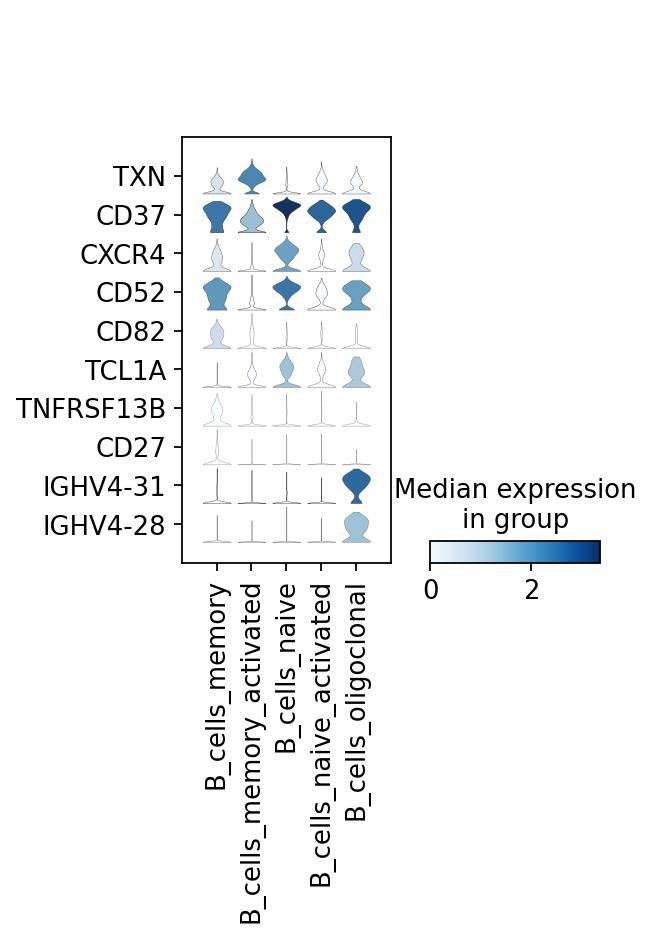

In [68]:
sc.pl.stacked_violin(adata_hvg[adata_hvg.obs['cell_type'].isin(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'])], 
             B_cell_markers, groupby = 'cell_type', 
                 use_raw = True, swap_axes = True,
                 size = 1, save = '_20210224_B_cell_manifold_twins.pdf')

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


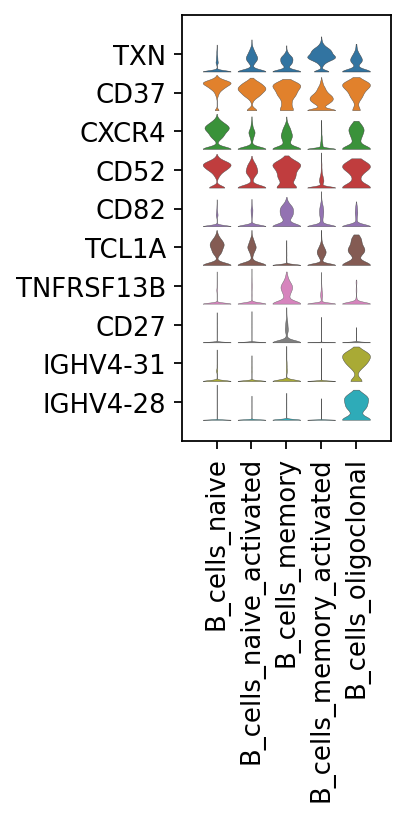

In [75]:
sc.pl.stacked_violin(adata_hvg[adata_hvg.obs['cell_type'].isin(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'])], 
             B_cell_markers, groupby = 'cell_type', 
                 use_raw = True, swap_axes = True,
                     row_palette='tab10',
                     categories_order = ['B_cells_naive', 'B_cells_naive_activated', 
                                         'B_cells_memory', 'B_cells_memory_activated',
                                         'B_cells_oligoclonal'],
                     size = 1, save = '20210224_B_cell_markers_B_cell_clusters_twins.pdf')

In [35]:
np.unique(adata_hvg.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

In [8]:
# producing tables for Javi
adata_act_mem_B_cells = adata_hvg[adata_hvg.obs['cell_type'] == 'B_cells_memory_activated'].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [9]:
# norm and log tr in .raw.X
adata_act_mem_B_cells.raw.X

<2376x17976 sparse matrix of type '<class 'numpy.float32'>'
	with 5015141 stored elements in Compressed Sparse Row format>

In [10]:
adata_act_mem_B_cells

AnnData object with n_obs × n_vars = 2376 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
dense_mtx = adata_act_mem_B_cells.raw.X.todense()

In [12]:
expr_mtx = pd.DataFrame(dense_mtx, 
                       index=adata_act_mem_B_cells.obs_names,
                       columns=adata_act_mem_B_cells.raw.var_names)

In [13]:
expr_mtx = expr_mtx.T
expr_mtx

index,TCAGGATCAGTTTACG-1,GCGAGAAGTACTCAAC-1,GAATGAAGTTCACGGC-1,GCTTCCAGTGTGTGCC-1,GTCTCGTTCTCAAGTG-1,ACCAGTAGTCGAGTTT-1,TGAGGGATCGTTACAG-1,GACGTGCTCATCTGCC-1-1,TACTCATGTGTGAAAT-1,CCTTACGAGGTGATTA-1,...,AGTGGGACAAGCGATG-1,GCATGTAAGTGCCATT-1,TGGCCAGCACGCGAAA-1,CCTACCACAGAGTGTG-1,GTGTGCGCAGGCGATA-1,GCTGGGTTCACGCGGT-1,ATCATCTTCGCGGATC-1,CTGATAGTCTAGCACA-1,CGGCTAGAGGACTGGT-1,TTAGGACGTTCGTCTC-1
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.3,0.0,0.0,0.0,0.0,0.181347,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.2,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AP006222.2,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP5-857K21.4,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RP4-681N20.5,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LINC00659,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PON3,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
meta_table = adata_act_mem_B_cells.obs.loc[expr_mtx.columns,:]

In [15]:
meta_table

,activation,barcode_sample,batch,bh_pval,condition,n_counts,n_genes,percent_mito,sample,scrublet_cluster_score,scrublet_score,technique,is_doublet,S_score,G2M_score,phase,cell_type
index,,,,,,,,,,,,,,,,,
TCAGGATCAGTTTACG-1,CD3,TCAGGATCAGTTTACG-1_Immunodeficiency8103073,2,0.737175,CVID,3776.0,1542,0.048199,Immunodeficiency8103073,0.103321,0.081340,10X,False,-0.106140,-0.146170,G1,B_cells_memory_activated
GCGAGAAGTACTCAAC-1,CD3,GCGAGAAGTACTCAAC-1_Immunodeficiency8103077,5,0.755494,CONTROL,6135.0,1921,0.044173,Immunodeficiency8103077,0.065354,0.061685,10X,False,-0.187550,-0.114097,G1,B_cells_memory_activated
GAATGAAGTTCACGGC-1,CD3,GAATGAAGTTCACGGC-1_Immunodeficiency8103077,5,0.755494,CONTROL,5605.0,1684,0.045852,Immunodeficiency8103077,0.058228,0.048951,10X,False,-0.068414,-0.113430,G1,B_cells_memory_activated
GCTTCCAGTGTGTGCC-1,CD3,GCTTCCAGTGTGTGCC-1_Immunodeficiency8103073,2,0.737175,CVID,4548.0,1629,0.043316,Immunodeficiency8103073,0.098390,0.167095,10X,False,-0.050700,-0.084317,G1,B_cells_memory_activated
GTCTCGTTCTCAAGTG-1,CD40L,GTCTCGTTCTCAAGTG-1_Immunodeficiency8103072,1,0.709764,CVID,50294.0,6063,0.057681,Immunodeficiency8103072,0.184466,0.276786,10X,False,0.193563,0.091368,S,B_cells_memory_activated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCTGGGTTCACGCGGT-1,CD40L,GCTGGGTTCACGCGGT-1_Immunodeficiency8103072,1,0.709764,CVID,8854.0,2463,0.036932,Immunodeficiency8103072,0.184466,0.098121,10X,False,-0.118236,-0.074108,G1,B_cells_memory_activated
ATCATCTTCGCGGATC-1,CD3,ATCATCTTCGCGGATC-1_Immunodeficiency8103077,5,0.755494,CONTROL,893.0,505,0.166853,Immunodeficiency8103077,0.059932,0.051875,10X,False,-0.033965,0.062089,G2M,B_cells_memory_activated
CTGATAGTCTAGCACA-1,CD3,CTGATAGTCTAGCACA-1_Immunodeficiency8103077,5,0.755494,CONTROL,1574.0,873,0.076239,Immunodeficiency8103077,0.058228,0.043542,10X,False,-0.181259,-0.118957,G1,B_cells_memory_activated


In [16]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [54]:
expr_mtx.to_csv(save_path + '20210224_B_cells_memory_activated_expression_matrix_normlog_twins.csv')

In [55]:
meta_table.to_csv(save_path + '20210224_B_cells_memory_activated_metadata_table_twins.csv')

In [18]:
meta_table

,activation,barcode_sample,batch,bh_pval,condition,n_counts,n_genes,percent_mito,sample,scrublet_cluster_score,scrublet_score,technique,is_doublet,S_score,G2M_score,phase,cell_type
index,,,,,,,,,,,,,,,,,
TCAGGATCAGTTTACG-1,CD3,TCAGGATCAGTTTACG-1_Immunodeficiency8103073,2,0.737175,CVID,3776.0,1542,0.048199,Immunodeficiency8103073,0.103321,0.081340,10X,False,-0.106140,-0.146170,G1,B_cells_memory_activated
GCGAGAAGTACTCAAC-1,CD3,GCGAGAAGTACTCAAC-1_Immunodeficiency8103077,5,0.755494,CONTROL,6135.0,1921,0.044173,Immunodeficiency8103077,0.065354,0.061685,10X,False,-0.187550,-0.114097,G1,B_cells_memory_activated
GAATGAAGTTCACGGC-1,CD3,GAATGAAGTTCACGGC-1_Immunodeficiency8103077,5,0.755494,CONTROL,5605.0,1684,0.045852,Immunodeficiency8103077,0.058228,0.048951,10X,False,-0.068414,-0.113430,G1,B_cells_memory_activated
GCTTCCAGTGTGTGCC-1,CD3,GCTTCCAGTGTGTGCC-1_Immunodeficiency8103073,2,0.737175,CVID,4548.0,1629,0.043316,Immunodeficiency8103073,0.098390,0.167095,10X,False,-0.050700,-0.084317,G1,B_cells_memory_activated
GTCTCGTTCTCAAGTG-1,CD40L,GTCTCGTTCTCAAGTG-1_Immunodeficiency8103072,1,0.709764,CVID,50294.0,6063,0.057681,Immunodeficiency8103072,0.184466,0.276786,10X,False,0.193563,0.091368,S,B_cells_memory_activated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCTGGGTTCACGCGGT-1,CD40L,GCTGGGTTCACGCGGT-1_Immunodeficiency8103072,1,0.709764,CVID,8854.0,2463,0.036932,Immunodeficiency8103072,0.184466,0.098121,10X,False,-0.118236,-0.074108,G1,B_cells_memory_activated
ATCATCTTCGCGGATC-1,CD3,ATCATCTTCGCGGATC-1_Immunodeficiency8103077,5,0.755494,CONTROL,893.0,505,0.166853,Immunodeficiency8103077,0.059932,0.051875,10X,False,-0.033965,0.062089,G2M,B_cells_memory_activated
CTGATAGTCTAGCACA-1,CD3,CTGATAGTCTAGCACA-1_Immunodeficiency8103077,5,0.755494,CONTROL,1574.0,873,0.076239,Immunodeficiency8103077,0.058228,0.043542,10X,False,-0.181259,-0.118957,G1,B_cells_memory_activated


In [20]:
meta_table.columns

Index(['activation', 'barcode_sample', 'batch', 'bh_pval', 'condition',
       'n_counts', 'n_genes', 'percent_mito', 'sample',
       'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet',
       'S_score', 'G2M_score', 'phase', 'cell_type'],
      dtype='object')

In [21]:
np.unique(meta_table['condition'], return_counts=True)

(array(['CONTROL', 'CVID'], dtype=object), array([1512,  864]))

In [22]:
np.unique(adata_hvg.obs['cell_type'], return_counts=True)

(array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
        'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object),
 array([ 347, 2376, 1547,  659,  190]))

In [23]:
adata_act_mem_B_cells = anndata.AnnData(X = adata_hvg[adata_hvg.obs['cell_type'] == 'B_cells_memory_activated'].raw.X,
                                        var = adata_hvg[adata_hvg.obs['cell_type'] == 'B_cells_memory_activated'].raw.var,
                                        obs = adata_hvg[adata_hvg.obs['cell_type'] == 'B_cells_memory_activated'].obs)

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [24]:
adata_act_mem_B_cells

AnnData object with n_obs × n_vars = 2376 × 17976
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5'

In [32]:
# reading the limma results for activated B cells
limma_DEGs = pd.read_csv('./limma_DE_analysis/20210215_B_cells_memory_activated_CVID_vs_B_cells_memory_activated_CONTROL_limma_DEGs.csv',
                        index_col=0)
# applying same cutoffs as in cellphone analysis
limma_DEGs = limma_DEGs[(limma_DEGs['adj.P.Val'] < 0.05) & (abs(limma_DEGs['logFC']) < 0.1)]
limma_DEGs

,logFC,P.Value,adj.P.Val,AveExpr_cluster,AveExpr_rest,percentExpr_cluster,percentExpr_rest
Gene,,,,,,,
ESCO2,0.097004,2.425706e-27,4.078761e-25,0.134852,0.037849,0.248843,0.068783
SPC25,0.085545,9.517062e-27,1.505203e-24,0.114726,0.029180,0.222222,0.058862
FUT7,0.094213,1.305615e-25,1.709499e-23,0.132719,0.038506,0.262731,0.070106
AURKB,0.086038,6.321574e-22,4.925894e-20,0.122490,0.036451,0.202546,0.064153
ADD2,0.079330,8.326116e-22,6.425187e-20,0.111181,0.031851,0.241898,0.061508
...,...,...,...,...,...,...,...
RP11-449H3.3,0.005253,1.651621e-02,4.986390e-02,0.007964,0.002711,0.021991,0.005291
DMTF1,0.034529,1.653542e-02,4.990454e-02,0.120735,0.086207,0.204861,0.090608
NELFA,0.042653,1.653592e-02,4.990454e-02,0.222436,0.179783,0.378472,0.187169


In [36]:
limma_DEGs_upreg = limma_DEGs[limma_DEGs['logFC'] > 0]
limma_DEGs_upreg = limma_DEGs_upreg.sort_values(by='logFC', axis=0, ascending=False)

limma_DEGs_downreg = limma_DEGs[limma_DEGs['logFC'] < 0]
limma_DEGs_downreg = limma_DEGs_downreg.sort_values(by='logFC', axis=0, ascending=False)


In [37]:
limma_DEGs_upreg

,logFC,P.Value,adj.P.Val,AveExpr_cluster,AveExpr_rest,percentExpr_cluster,percentExpr_rest
Gene,,,,,,,
GPSM3,0.099978,1.744507e-03,0.007545,0.667135,0.567157,0.648148,0.398148
RPAP3,0.099931,6.225053e-07,0.000006,0.302908,0.202977,0.432870,0.203704
PTRH1,0.099879,1.039538e-07,0.000001,0.310962,0.211082,0.464120,0.219577
TCF4,0.099790,6.700622e-06,0.000050,0.334963,0.235173,0.434028,0.216931
CSNK2A1,0.099770,3.138545e-07,0.000003,0.303367,0.203597,0.445602,0.203042
...,...,...,...,...,...,...,...
PKP2,0.000822,1.160768e-02,0.037361,0.000822,0.000000,0.004630,0.000000
SLC30A3,0.000699,1.347305e-02,0.042274,0.000699,0.000000,0.004630,0.000000
IGKV1-37,0.000682,1.261936e-02,0.040076,0.000682,0.000000,0.004630,0.000000


In [38]:
limma_DEGs_downreg

,logFC,P.Value,adj.P.Val,AveExpr_cluster,AveExpr_rest,percentExpr_cluster,percentExpr_rest
Gene,,,,,,,
SGPP2,-0.012127,1.551459e-02,4.748027e-02,0.001496,0.013623,0.004630,0.012566
RP5-1071N3.1,-0.014444,1.574847e-02,4.800879e-02,0.004804,0.019247,0.011574,0.019841
COPRS,-0.017421,8.792889e-03,2.971390e-02,0.022939,0.040361,0.064815,0.070106
IL2,-0.018275,5.437989e-03,1.981396e-02,0.002500,0.020775,0.001157,0.013889
CAMK4,-0.019461,7.643594e-04,3.618814e-03,0.003869,0.023330,0.013889,0.027116
...,...,...,...,...,...,...,...
CXCL11,-0.091867,4.678932e-08,5.204823e-07,0.022216,0.114084,0.019676,0.063492
SNX11,-0.095102,1.627989e-03,7.099508e-03,0.418432,0.513534,0.481481,0.386243
PPP1R15A,-0.095216,1.255800e-02,3.990481e-02,0.687826,0.783041,0.646991,0.481481


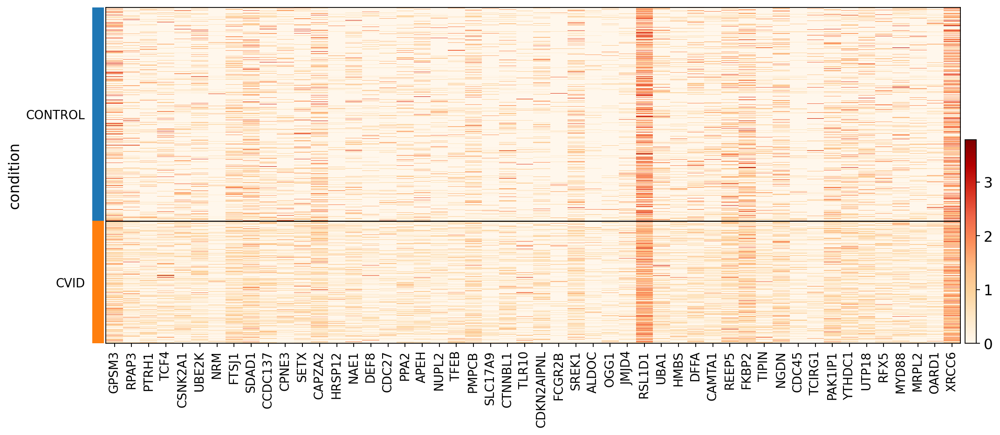

In [46]:
sc.pl.heatmap(adata_act_mem_B_cells, groupby='condition', var_names = list(limma_DEGs_upreg.index)[:50],
             cmap='OrRd',
             )

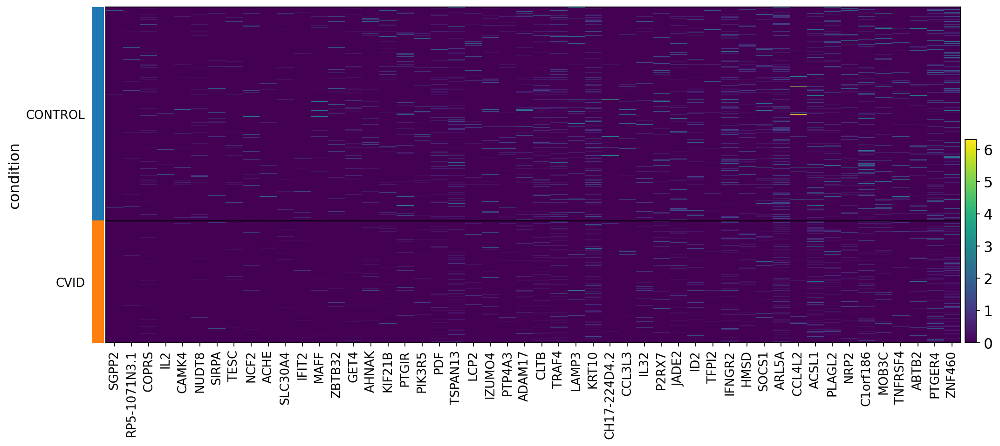

In [41]:
sc.pl.heatmap(adata_act_mem_B_cells, groupby='condition', var_names = list(limma_DEGs_downreg.index)[:50] )

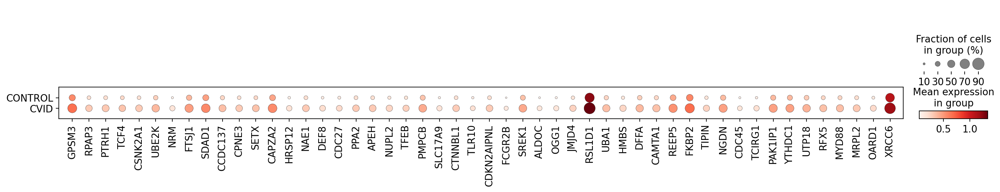

In [42]:
sc.pl.dotplot(adata_act_mem_B_cells, groupby='condition', var_names = list(limma_DEGs_upreg.index)[:50])

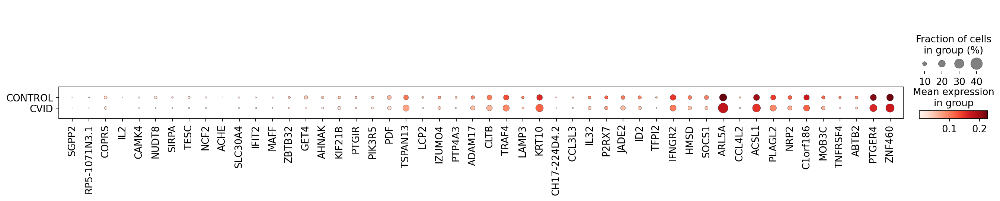

In [43]:
sc.pl.dotplot(adata_act_mem_B_cells, groupby='condition', var_names = list(limma_DEGs_downreg.index)[:50])